# Detección de Tejido Cancerígeno en Imágenes de Histología

En la era contemporánea, la integración de la tecnología con la medicina ha abierto puertas innovadoras para el diagnóstico y tratamiento de diversas enfermedades, incluido el cáncer. Una de las técnicas emergentes en este panorama es la la clasificación de imágenes, una especialidad dentro del aprendizaje profundo, dedicada a la identificación de estructuras dentro de una imagen.

En el ámbito de la oncología, el análisis microscópico de muestras de tejido, conocido como histología, ha sido el estándar de oro para la detección y clasificación de tejidos cancerosos. Sin embargo, esta tarea es notoriamente laboriosa y depende en gran medida de la habilidad y experiencia del patólogo.

En este contexto, la Inteligencia Artificial se presenta como una herramienta prometedora para asistir y potencialmente revolucionar los métodos tradicionales de diagnóstico histológico. Mediante el uso de algoritmos avanzados, es posible analizar grandes cantidades de imágenes histológicas con una precisión y rapidez sin precedentes, facilitando así la identificación temprana de tejido cancerígeno y ayudando a tomar decisiones clínicas más precisas.

En este taller, la idea es que ustedes construyan un sistema que permita identificar tejido cancerígeno en imágenes histológicas. El modelo que construyan debe contener, al menos estos elementos.

1. Construir una red neuronal convolucional. Esta puede construirse desde cero o utilizando transfer learning.

2. Deben realizar DataAugmentation.

3. Deben realizar búsqueda de hiperparámetros para, el menos, uno de lo hiperparámetros de la red que diseñen.

4. Reportar las gráficas de loss para el train y test.

5. Deben reportar el rendimiento del modelo, sobre el conjunto de prueba, a partir del accuracy y el F-1 score.

6. El F-1 score, sobre el conjunto de test, debe ser de al menos el 80%.


## 1. Se Descarga y descomprime la base de datos

La base de datos está dividida en dos carpetas; en la primera se encuentran los datos de entrenamiento, en la segunda los datos de prueba.

In [51]:
!pip install gdown


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [52]:
!gdown 1c2mrPeND5-jxL43Im8eDi5PCyuTGBLEX

^C
Traceback (most recent call last):
  File "/Users/alacartaapp/.pyenv/versions/3.9.7/bin/gdown", line 8, in <module>
    sys.exit(main())
  File "/Users/alacartaapp/.pyenv/versions/3.9.7/lib/python3.9/site-packages/gdown/__main__.py", line 172, in main
    download(
  File "/Users/alacartaapp/.pyenv/versions/3.9.7/lib/python3.9/site-packages/gdown/download.py", line 202, in download
    res = sess.get(url, stream=True, verify=verify)
  File "/Users/alacartaapp/.pyenv/versions/3.9.7/lib/python3.9/site-packages/requests/sessions.py", line 602, in get
    return self.request("GET", url, **kwargs)
  File "/Users/alacartaapp/.pyenv/versions/3.9.7/lib/python3.9/site-packages/requests/sessions.py", line 589, in request
    resp = self.send(prep, **send_kwargs)
  File "/Users/alacartaapp/.pyenv/versions/3.9.7/lib/python3.9/site-packages/requests/sessions.py", line 703, in send
    r = adapter.send(request, **kwargs)
  File "/Users/alacartaapp/.pyenv/versions/3.9.7/lib/python3.9/site-packages

In [5]:
!gdown 1c2mrPeND5-jxL43Im8eDi5PCyuTGBLEX
!gdown 1n_zGW0qht4rQauar3hQkqpz8sreb0SRv

Failed to retrieve file url:

	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1c2mrPeND5-jxL43Im8eDi5PCyuTGBLEX

but Gdown can't. Please check connections and permissions.
Downloading...
From (original): https://drive.google.com/uc?id=1n_zGW0qht4rQauar3hQkqpz8sreb0SRv
From (redirected): https://drive.google.com/uc?id=1n_zGW0qht4rQauar3hQkqpz8sreb0SRv&confirm=t&uuid=f1f47ea4-9df4-4c69-9213-b00132e82437
To: /Users/alacartaapp/dev/maestria/trabajo-final-cnn/test.zip
100%|████████████████████████████████████████| 380M/380M [00:15<00:00, 24.9MB/s]


In [10]:
!gdown 1n_zGW0qht4rQauar3hQkqpz8sreb0SRv

Downloading...
From (original): https://drive.google.com/uc?id=1n_zGW0qht4rQauar3hQkqpz8sreb0SRv
From (redirected): https://drive.google.com/uc?id=1n_zGW0qht4rQauar3hQkqpz8sreb0SRv&confirm=t&uuid=41d714bb-cb71-4a39-ac98-ff6568155e54
To: /Users/alacartaapp/dev/maestria/trabajo-final-cnn/test.zip
100%|████████████████████████████████████████| 380M/380M [00:09<00:00, 40.3MB/s]


In [12]:
#Se decomprimen los archivos zip descargados

!unzip ./content/train.zip
# !unzip ./content/test.zip

Archive:  ./content/train.zip
   creating: Train_non_experts_simple/
   creating: Train_non_experts_simple/1/
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_0_y_ini_0.png  
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_670_y_ini_0.png  
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_804_y_ini_0.png  
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_938_y_ini_0.png  
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_1072_y_ini_0.png  
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_1206_y_ini_0.png  
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_1340_y_ini_0.png  
  inflating: Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_1474_y_ini_0.png  
  inflating: Tra

## 2. Descripción de la compocisión de la base de datos y visualización de algunas muestras.

Como se puede notar en las carpetas de entrenamiento y prueba existen 3 subcarpetas llamadas 0, 1, 2, la cuales representan cada una de las clases del problema. De esta forma.

- Las imágenes en la carpeta 0 corresponden a tumores.

- Las imágenes en la carpeta 1 corresponden a Estroma (Tejido conjuntivo)

- Las imágenes en la carpeta 2 corresponden a tejidos con inflamación benigna.

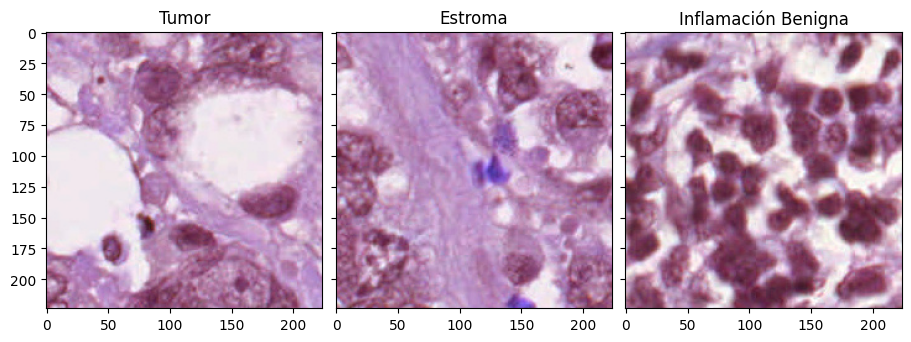

In [10]:
import matplotlib.pyplot as plt
import cv2

Train_dir_i = './content/Train_non_experts_simple' #Dirección de las imágenes de entrenamiento


fig, axs = plt.subplots(1, 3, figsize=(9, 5), layout='constrained',
                        sharex=True, sharey=True)

# Se carga una imagen de la carpeta 0 (Tumor)
file_name_i = './content/Train_non_experts_simple/1/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_0_y_ini_0.png'
Img_i = cv2.imread(file_name_i)
plt.subplot(1, 3, 1)
plt.title("Tumor")
plt.imshow(Img_i)

# Se carga una imagen de la carpeta 1 (Estroma)
file_name_i = './content/Train_non_experts_simple/2/TCGA-A1-A0SK-DX1_xmin45749_ymin25055_A0SK_A1_x_ini_0_y_ini_2412.png'
Img_i = cv2.imread(file_name_i)
plt.subplot(1, 3, 2)
plt.title("Estroma")
plt.imshow(Img_i)

# Se carga una imagen de la carpeta 2 (Inflamación Benigna)
file_name_i = './content/Train_non_experts_simple/3/TCGA-A1-A0SP-DX1_xmin6798_ymin53719_A0SP_A1_x_ini_1072_y_ini_0.png'
Img_i = cv2.imread(file_name_i)
plt.subplot(1, 3, 3)
plt.title("Inflamación Benigna")
plt.imshow(Img_i)



# Crear un DataLoader para las imágenes de entrenamiento

In [37]:
from torchvision import transforms

# Define the image transformations
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

In [38]:

from torchvision import datasets
from torchvision import transforms

Test_dir_i = './content/Test'

train_data = datasets.ImageFolder(root=Train_dir_i, transform=transform)
test_data = datasets.ImageFolder(root=Test_dir_i, transform=transforms.ToTensor())

print(f"Train data:\n{train_data}\nTest data:\n{test_data}")

Train data:
Dataset ImageFolder
    Number of datapoints: 75243
    Root location: ./content/Train_non_experts_simple
    StandardTransform
Transform: Compose(
               Resize(size=(299, 299), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )
Test data:
Dataset ImageFolder
    Number of datapoints: 4364
    Root location: ./content/Test
    StandardTransform
Transform: ToTensor()


In [39]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
test_loader = DataLoader(test_data, batch_size=64, shuffle=True)

print(f"Train loader:\n{train_loader}\nTest loader:\n{test_loader}")


Train loader:
Test loader:


# Voy a usar transfer learning para este problema.

Voy a descargarme el modelo InceptionV3 de torchvision.

In [40]:
import matplotlib.pyplot as plt

import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms, models
from torchvision.transforms import ToTensor
import os, shutil

In [85]:
# Se verifica la disponibilidad de la GPU
device = torch.device('mps' if torch.mps.is_available() else 'cpu')
#device = torch.device('mps' if torch.cuda.is_available() else 'cpu')

print(device)


mps


In [86]:
from torchvision import models

inception_model = models.inception_v3(pretrained=True)


# print the layers of the model
print(inception_model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [87]:
for param in inception_model.parameters():
    param.requires_grad = False


In [88]:
import torchinfo

from torchinfo import summary

summary(inception_model, input_size=(1, 3, 299, 299))

Layer (type:depth-idx)                   Output Shape              Param #
Inception3                               [1, 1000]                 3,326,696
├─BasicConv2d: 1-1                       [1, 32, 149, 149]         --
│    └─Conv2d: 2-1                       [1, 32, 149, 149]         (864)
│    └─BatchNorm2d: 2-2                  [1, 32, 149, 149]         (64)
├─BasicConv2d: 1-2                       [1, 32, 147, 147]         --
│    └─Conv2d: 2-3                       [1, 32, 147, 147]         (9,216)
│    └─BatchNorm2d: 2-4                  [1, 32, 147, 147]         (64)
├─BasicConv2d: 1-3                       [1, 64, 147, 147]         --
│    └─Conv2d: 2-5                       [1, 64, 147, 147]         (18,432)
│    └─BatchNorm2d: 2-6                  [1, 64, 147, 147]         (128)
├─MaxPool2d: 1-4                         [1, 64, 73, 73]           --
├─BasicConv2d: 1-5                       [1, 80, 73, 73]           --
│    └─Conv2d: 2-7                       [1, 80, 73, 73] 

In [89]:
inception_model.fc = nn.Sequential(
    nn.Linear(in_features=2048, out_features=3),
    nn.ReLU()
).to(device)

# Unfreeze the final FC layer for training
for param in inception_model.fc.parameters():
    param.requires_grad = True

summary(inception_model, input_size=(1, 3, 299, 299))

Layer (type:depth-idx)                   Output Shape              Param #
Inception3                               [1, 3]                    3,326,696
├─BasicConv2d: 1-1                       [1, 32, 149, 149]         --
│    └─Conv2d: 2-1                       [1, 32, 149, 149]         (864)
│    └─BatchNorm2d: 2-2                  [1, 32, 149, 149]         (64)
├─BasicConv2d: 1-2                       [1, 32, 147, 147]         --
│    └─Conv2d: 2-3                       [1, 32, 147, 147]         (9,216)
│    └─BatchNorm2d: 2-4                  [1, 32, 147, 147]         (64)
├─BasicConv2d: 1-3                       [1, 64, 147, 147]         --
│    └─Conv2d: 2-5                       [1, 64, 147, 147]         (18,432)
│    └─BatchNorm2d: 2-6                  [1, 64, 147, 147]         (128)
├─MaxPool2d: 1-4                         [1, 64, 73, 73]           --
├─BasicConv2d: 1-5                       [1, 80, 73, 73]           --
│    └─Conv2d: 2-7                       [1, 80, 73, 73] 

In [90]:
inception_model = inception_model.to(device)

## define loss function and optimizer

In [91]:

loss_fn = nn.CrossEntropyLoss() # Función de pérdida
optimizer = torch.optim.Adam(inception_model.fc.parameters(), lr=0.001) # Optimizador

In [71]:
# # import InceptionOutputs
# from torchvision.models.inception import InceptionOutputs

# epochs = 5

# loss_tr = []
# loss_te = []

# # Training loop without auxiliary outputs
# for epoch in range(epochs):
#     print(f"Epoch {epoch+1}\n-------------------------------")
#     inception_model.train()
#     running_loss = 0.0

#     for batch, (X, y) in enumerate(train_loader):
#         x = X.to(device)
#         y = y.to(device, dtype=torch.long)

#         # Forward pass
#         outputs = inception_model(x)
#         # outputs is an InceptionOutputs object during training
#         main_output = outputs.logits
#         aux_output = outputs.aux_logits

#         # Compute loss
#         loss1 = loss_fn(main_output, y)
#         loss2 = loss_fn(aux_output, y)
#         loss = loss1 + 0.4 * loss2

#         # Backward pass and optimization
#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#         running_loss += loss.item()

#     epoch_loss = running_loss / len(train_loader)
#     loss_tr.append(epoch_loss)
#     print(f"Epoch {epoch+1} Loss: {epoch_loss:.4f}")
        

        



In [92]:
# Check which parameters will be updated (trained)
for name, param in inception_model.named_parameters():
    print(f"{name}: requires_grad={param.requires_grad}")

Conv2d_1a_3x3.conv.weight: requires_grad=False
Conv2d_1a_3x3.bn.weight: requires_grad=False
Conv2d_1a_3x3.bn.bias: requires_grad=False
Conv2d_2a_3x3.conv.weight: requires_grad=False
Conv2d_2a_3x3.bn.weight: requires_grad=False
Conv2d_2a_3x3.bn.bias: requires_grad=False
Conv2d_2b_3x3.conv.weight: requires_grad=False
Conv2d_2b_3x3.bn.weight: requires_grad=False
Conv2d_2b_3x3.bn.bias: requires_grad=False
Conv2d_3b_1x1.conv.weight: requires_grad=False
Conv2d_3b_1x1.bn.weight: requires_grad=False
Conv2d_3b_1x1.bn.bias: requires_grad=False
Conv2d_4a_3x3.conv.weight: requires_grad=False
Conv2d_4a_3x3.bn.weight: requires_grad=False
Conv2d_4a_3x3.bn.bias: requires_grad=False
Mixed_5b.branch1x1.conv.weight: requires_grad=False
Mixed_5b.branch1x1.bn.weight: requires_grad=False
Mixed_5b.branch1x1.bn.bias: requires_grad=False
Mixed_5b.branch5x5_1.conv.weight: requires_grad=False
Mixed_5b.branch5x5_1.bn.weight: requires_grad=False
Mixed_5b.branch5x5_1.bn.bias: requires_grad=False
Mixed_5b.branch5x5_

In [93]:
for param_group in optimizer.param_groups:
    for param in param_group['params']:
        print(param.shape)

torch.Size([3, 2048])
torch.Size([3])


In [53]:
!pip install tqdm


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [94]:
from tqdm import tqdm  


epochs = 30
loss_tr = []
loss_te = []

for epoch in range(epochs):
    print(f"\nEpoch {epoch+1}/{epochs}:")
    inception_model.train()
    running_loss = 0.0

    # Create a progress bar for the training loop
    train_loader_tqdm = tqdm(train_loader, desc='Training', leave=False)
    
    for batch, (X, y) in enumerate(train_loader_tqdm):
        x = X.to(device)
        y = y.to(device, dtype=torch.long)

        # Forward pass
        outputs = inception_model(x)
        # outputs is an InceptionOutputs object during training
        main_output = outputs.logits
        aux_output = outputs.aux_logits

        # Compute loss
        loss1 = loss_fn(main_output, y)
        loss2 = loss_fn(aux_output, y)
        loss = loss1 + 0.4 * loss2

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loss_tr.append(loss.item())

        # Update the progress bar description
        train_loader_tqdm.set_postfix({'batch_loss': loss.item()})

    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1} Loss: {epoch_loss:.4f}")

    # Validation loop with progress bar
    inception_model.eval()
    correct = 0
    total = 0
    validation_loss = 0.0

    with torch.no_grad():
        test_loader_tqdm = tqdm(test_loader, desc='Validation', leave=False)
        for X_val, y_val in test_loader_tqdm:
            X_val = X_val.to(device)
            y_val = y_val.to(device, dtype=torch.long)
            pred = inception_model(X_val)            
            loss = loss_fn(pred, y_val)
            validation_loss += loss.item()

            _, predicted = torch.max(pred.data, 1) 
            total += y_val.size(0)
            correct += (predicted == y_val).sum().item()

            # Update the progress bar description
            test_loader_tqdm.set_postfix({'batch_loss': loss.item()})

    accuracy = 100 * correct / total
    avg_validation_loss = validation_loss / len(test_loader)
    loss_te.append(avg_validation_loss)
    print(f"Validation Loss: {avg_validation_loss:.4f} | Accuracy: {accuracy:.2f}%")


Epoch 1/30:


Epoch 1 Loss: 3.8238


Validation Loss: 0.9516 | Accuracy: 61.04%

Epoch 2/30:


Epoch 2 Loss: 3.7861


Validation Loss: 0.9724 | Accuracy: 61.02%

Epoch 3/30:


Epoch 3 Loss: 3.7879


Validation Loss: 0.9871 | Accuracy: 59.62%

Epoch 4/30:


Epoch 4 Loss: 3.7839


Validation Loss: 1.0466 | Accuracy: 61.87%

Epoch 5/30:


Epoch 5 Loss: 3.7832


Validation Loss: 0.9148 | Accuracy: 65.03%

Epoch 6/30:


Epoch 6 Loss: 3.7824


Validation Loss: 1.0281 | Accuracy: 63.86%

Epoch 7/30:


Epoch 7 Loss: 3.7832


Validation Loss: 1.0017 | Accuracy: 57.63%

Epoch 8/30:


KeyboardInterrupt: 

In [67]:
# Save the model and optimizer state dictionaries
torch.save({
    'model_state_dict': inception_model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'epoch': epoch,  # Current epoch (optional)
    'loss': loss,    # Loss value at saving point (optional)
}, 'checkpoint.pth')

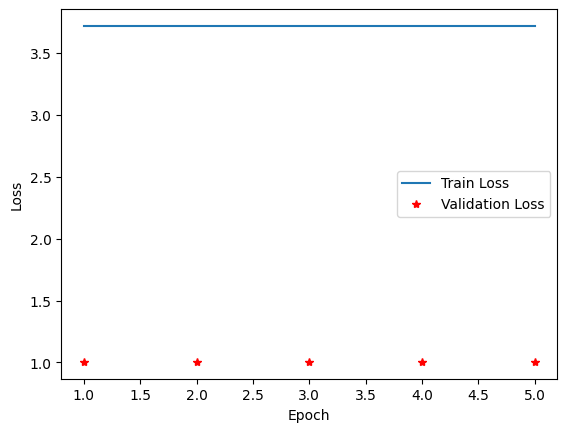

In [70]:
# Plot the losses for the train and test sets
import numpy as np
plt.plot(loss_tr)
plt.plot(np.arange(1,5+1)*len(train_loader.dataset)//32,loss_te, 'r*')
plt.show()